<a href="https://colab.research.google.com/github/m-parchami/3DVehicleDetection/blob/main/Thesis_for_the_win_3_complete.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **General**


## Mount


In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


##Import Packages


In [ ]:
%tensorflow_version 1.x
from keras.models import Sequential
from keras.layers.core import Flatten, Dense, Dropout, Reshape, Lambda
from keras.layers.convolutional import Conv2D, Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.optimizers import Adam
import tensorflow as tf
from keras import backend as K
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.layers.advanced_activations import LeakyReLU
from keras.layers import Input, Dense
from keras.models import Model
import matplotlib.pyplot as plt
from keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint
import copy
import cv2, os
import numpy as np
from random import shuffle 
from keras.applications.vgg16 import VGG16 
import pickle


#From the source - ignore 
get_ipython().magic(u'matplotlib inline')

##Download the Dataset


In [ ]:
!wget https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_image_2.zip

In [ ]:
!unzip data_object_image_2.zip

In [ ]:
!ls -l training/image_2 | wc -l

In [ ]:
!wget https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_label_2.zip

In [ ]:
! unzip data_object_label_2.zip

In [ ]:
!ls -l training/label_2 | wc -l

## Setup Tensorboard

In [ ]:
%reload_ext tensorboard
# !kill 462


# %load_ext tensorboard
%tensorboard --logdir /content/output_train


Reusing TensorBoard on port 6006 (pid 525), started 0:03:47 ago. (Use '!kill 525' to kill it.)

##Global Parameters

In [ ]:
BIN, OVERLAP = 6, 0.1
W = 1.
NORM_H, NORM_W = 224, 224
VEHICLES = ['Car', 'Truck', 'Van', 'Tram']

image_dir = 'training/image_2/'
label_dir = 'training/label_2/'
FRAME_SHAPE = (375, 1242, 3)

##Utils (compute_anchors, prepare_input_and_output, data_gen l2_normalize, orientation loss)



In [ ]:
def compute_anchors(angle):
    anchors = []
    
    wedge = 2.*np.pi/BIN
    l_index = int(angle/wedge)
    r_index = l_index + 1
    
    if (angle - l_index*wedge) < wedge/2 * (1+OVERLAP/2):
        anchors.append([l_index, angle - l_index*wedge])
        
    if (r_index*wedge - angle) < wedge/2 * (1+OVERLAP/2):
        anchors.append([r_index%BIN, angle - r_index*wedge])
        
    return anchors

def prepare_input_and_output(train_inst):
    ### Prepare image patch
    xmin = train_inst['xmin'] + np.random.randint(-MAX_JIT, MAX_JIT+1)
    ymin = train_inst['ymin'] + np.random.randint(-MAX_JIT, MAX_JIT+1)
    xmax = train_inst['xmax'] + np.random.randint(-MAX_JIT, MAX_JIT+1)
    ymax = train_inst['ymax'] + np.random.randint(-MAX_JIT, MAX_JIT+1)


    frame_shape = (375, 1242, 3)
    xmin = max(min(xmin, FRAME_SHAPE[1]-1),0)
    xmax = max(min(xmax, FRAME_SHAPE[1]-1),0)
    ymin = max(min(ymin, FRAME_SHAPE[0]-1),0)
    ymax = max(min(ymax, FRAME_SHAPE[0]-1),0)
    
    img = cv2.imread(image_dir + train_inst['image'])
    img = copy.deepcopy(img[ymin:ymax+1,xmin:xmax+1]).astype(np.float32)
    
    # re-color the image
    #img += np.random.randint(-2, 3, img.shape).astype('float32')
    #t  = [np.random.uniform()]
    #t += [np.random.uniform()]
    #t += [np.random.uniform()]
    #t = np.array(t)

    #img = img * (1 + t)
    #img = img / (255. * 2.)

    # flip the image
    flip = np.random.binomial(1, .5)
    if flip > 0.5: img = cv2.flip(img, 1)
        
    # resize the image to standard size
    img = cv2.resize(img, (NORM_H, NORM_W))
    img = img / 255.0 - 0.5
    
    ### Fix orientation and confidence
    if flip > 0.5:
        return img, train_inst['dims'], train_inst['orient_flipped'], train_inst['conf_flipped']
    else:
        return img, train_inst['dims'], train_inst['orient'], train_inst['conf']

def data_gen(all_objs, batch_size):
    num_obj = len(all_objs)
    
    keys = range(num_obj)
    np.random.shuffle(list(keys))
    
    l_bound = 0
    r_bound = batch_size if batch_size < num_obj else num_obj
    
    while True:
        if l_bound == r_bound:
            l_bound  = 0
            r_bound = batch_size if batch_size < num_obj else num_obj
            np.random.shuffle(list(keys))
        
        currt_inst = 0
        x_batch = np.zeros((r_bound - l_bound, 224, 224, 3))
        d_batch = np.zeros((r_bound - l_bound, 3))
        o_batch = np.zeros((r_bound - l_bound, BIN, 2))
        c_batch = np.zeros((r_bound - l_bound, BIN))
        
        for key in keys[l_bound:r_bound]:
            # augment input image and fix object's orientation and confidence
            image, dimension, orientation, confidence = prepare_input_and_output(all_objs[key])
            
            x_batch[currt_inst, :] = image
            d_batch[currt_inst, :] = dimension
            o_batch[currt_inst, :] = orientation
            c_batch[currt_inst, :] = confidence
            
            currt_inst += 1
                
        yield x_batch, [d_batch, o_batch, c_batch]
        
        l_bound  = r_bound
        r_bound = r_bound + batch_size
        if r_bound > num_obj: r_bound = num_obj

def l2_normalize(x):
    return tf.nn.l2_normalize(x, axis=2)

def orientation_loss(y_true, y_pred):
    # Find number of anchors
    anchors = tf.reduce_sum(tf.square(y_true), axis=2)
    anchors = tf.greater(anchors, tf.constant(0.5))
    anchors = tf.reduce_sum(tf.cast(anchors, tf.float32), 1)
    
    # Define the loss
    loss = -(y_true[:,:,0]*y_pred[:,:,0] + y_true[:,:,1]*y_pred[:,:,1]) #TODO: SHOULD IT BE -1 OR 1???????
    loss = tf.reduce_sum(loss, axis=1)
    loss = loss / anchors
    
    return tf.reduce_mean(loss)

##Parse annotation (Function)

In [ ]:
def parse_annotation(label_dir, image_dir):
    all_objs = []
    
    dims_avg = {key:np.array([0, 0, 0]) for key in VEHICLES}
    dims_cnt = {key:0 for key in VEHICLES}
    
    print(len(os.listdir(label_dir)), "files found")
    lcnt = 0
    for label_file in os.listdir(label_dir)[:-1]:
        image_file = label_file.replace('txt', 'png')

        for line in open(label_dir + label_file).readlines():
            line = line.strip().split(' ')
            truncated = np.abs(float(line[1]))
            occluded  = np.abs(float(line[2]))

            if line[0] in VEHICLES and truncated < 0.8 and occluded <= 1:
              
                new_alpha = -float(line[3]) + 3*np.pi/2
                new_alpha = new_alpha - np.floor(new_alpha / (2. * np.pi)) * (2. * np.pi)

                #new_alpha = float(line[3]) + np.pi/2.
                #if new_alpha < 0:
                #    new_alpha = new_alpha + 2.*np.pi

                #new_alpha = new_alpha - np.floor( new_alpha / (2.*np.pi) ) * (2.*np.pi)

                obj = {'name':line[0],
                       'image':image_file,
                       'xmin':int(float(line[4])),
                       'ymin':int(float(line[5])),
                       'xmax':int(float(line[6])),
                       'ymax':int(float(line[7])),
                       'dims':np.array([float(number) for number in line[8:11]]),
                       'new_alpha': new_alpha
                      }
                
                #update the average while reading the new object's dimensions
                dims_avg[obj['name']]  = dims_cnt[obj['name']]*dims_avg[obj['name']] + obj['dims']
                dims_cnt[obj['name']] += 1
                dims_avg[obj['name']] /= dims_cnt[obj['name']]

                all_objs.append(obj)
            
    return all_objs, dims_avg

## Process data



In [ ]:
all_objs, dims_avg = parse_annotation(label_dir, image_dir)

print("number of objects:", len(all_objs))
print("sample")
print(all_objs[0])
print(dims_avg)
#for obj in all_objs:
#  print(obj)

for obj in all_objs:

    # Fix dimensions, compute the residual
    obj['dims'] = obj['dims'] - dims_avg[obj['name']]
    
    # Fix orientation and confidence for no flip

    # make all residuals 0
    orientation = np.zeros((BIN,2))
    # make all bin confidences 0
    confidence = np.zeros(BIN)
    
    #turn angles into -> [bin# , residual]
    anchors = compute_anchors(obj['new_alpha'])
    
    for anchor in anchors:
        #compute the cosine and sine of the residual
        orientation[anchor[0]] = np.array([np.cos(anchor[1]), np.sin(anchor[1])])

        #make the confidence of relative bin# 1
        confidence[anchor[0]] = 1.
        
    #normalize confidences
    confidence = confidence / np.sum(confidence)
        
    #add the computed orientation and confidence to the obj
    obj['orient'] = orientation
    obj['conf'] = confidence
        
    # Fix orientation and confidence for flip
    orientation = np.zeros((BIN,2))
    confidence = np.zeros(BIN)
    
    anchors = compute_anchors(2.*np.pi - obj['new_alpha'])
    
    for anchor in anchors:
        orientation[anchor[0]] = np.array([np.cos(anchor[1]), np.sin(anchor[1])])
        confidence[anchor[0]] = 1
        
    confidence = confidence / np.sum(confidence)
        
    obj['orient_flipped'] = orientation
    obj['conf_flipped'] = confidence

7481 files found
number of objects: 23013
sample
{'name': 'Car', 'image': '000592.png', 'xmin': 540, 'ymin': 175, 'xmax': 629, 'ymax': 260, 'dims': array([1.54, 1.63, 3.67]), 'new_alpha': 6.25238898038469}
{'Car': array([1.5259155 , 1.63329825, 3.89241995]), 'Truck': array([ 3.21223545,  2.59305556, 10.61243386]), 'Van': array([2.19597911, 1.90370757, 5.12584204]), 'Tram': array([ 3.5112709 ,  2.45789298, 18.00354515])}


## Pickle/Unpickle the data

In [ ]:
#with open('/content/gdrive/MyDrive/objs.pkl', 'wb') as f:
#  pickle.dump([all_objs, dims_avg], f)

In [ ]:

# with open('/content/gdrive/MyDrive/objs.pkl', 'rb') as f:
#   all_objs, dims_avg = pickle.load(f)
# print(len(all_objs), 'objects')
# print('sample', all_objs[0])
# print('Statistics')
# print(dims_avg)


## Load Camera Calibration Files

In [ ]:
!wget https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_calib.zip
!unzip data_object_calib.zip

## Download and Unzip Pretrained 2D Detection Network

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_resnet101_kitti_2018_01_28.tar.gz

In [ ]:
!tar -xvf faster_rcnn_resnet101_kitti_2018_01_28.tar.gz

# **Set up (and Train) 3D Model**

## Build 3D Model(Function and usage)

In [ ]:
# Construct the network
''' First source code backbone (before Flatten())
inputs = Input(shape=(224,224,3))
# Block 1
x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

# Block 2
x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

# Block 3
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

# Block 4
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

# Block 5
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)
'''

def build_model(input_shape=(224, 224, 3), vgg_weights=None, freeze_vgg=False):

    vgg16_model = VGG16(include_top=False, weights=vgg_weights, input_shape=input_shape)

    if freeze_vgg:
        for layer in vgg16_model.layers:
            layer.trainable = False

    x = Flatten()(vgg16_model.output)

    dimension   = Dense(512)(x)
    dimension   = LeakyReLU(alpha=0.1)(dimension)
    dimension   = Dropout(0.5)(dimension)
    dimension   = Dense(3)(dimension)
    dimension   = LeakyReLU(alpha=0.1, name='dimension')(dimension)

    orientation = Dense(256)(x)
    orientation = LeakyReLU(alpha=0.1)(orientation)
    orientation = Dropout(0.5)(orientation)
    orientation = Dense(BIN*2)(orientation)
    orientation = LeakyReLU(alpha=0.1)(orientation)
    orientation = Reshape((BIN,-1))(orientation)
    orientation = Lambda(l2_normalize, name='orientation')(orientation)

    confidence  = Dense(256)(x)
    confidence  = LeakyReLU(alpha=0.1)(confidence)
    confidence  = Dropout(0.5)(confidence)
    confidence  = Dense(BIN, activation='softmax', name='confidence')(confidence)

    model = Model(vgg16_model.input, outputs=[dimension, orientation, confidence])
    model.summary() 


    #load weights
    #model.load_weights('/content/gdrive/MyDrive/weights_new2.hdf5')



    return model 

##Pre-training Stuff

In [ ]:
model = build_model(input_shape = (224, 224, 3), vgg_weights = 'imagenet')

early_stop  = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10, mode='min', verbose=1)
checkpoint  = ModelCheckpoint('/content/gdrive/MyDrive/saves/saved_weights.hdf5', monitor='val_loss', verbose=1, save_best_only=True, mode='min', period=1)
tensorboard = TensorBoard(log_dir='../logs/', histogram_freq=0, write_graph=True, write_images=False)

all_exams  = len(all_objs)
trv_split  = int(0.85*all_exams)
batch_size = 32
np.random.shuffle(all_objs)

train_gen = data_gen(all_objs[:trv_split],          batch_size)
valid_gen = data_gen(all_objs[trv_split:all_exams], batch_size)

train_num = int(np.ceil(trv_split/batch_size))
valid_num = int(np.ceil((all_exams - trv_split)/batch_size))

print("training configurations:")
print("all data:", all_exams)
print("training data:", trv_split)
print("batch size:", batch_size)
print("train_num", train_num)
print("valid_num", valid_num)


minimizer  = Adam(lr=1e-5)
model.compile(optimizer=minimizer, #minimizer,
              loss={'dimension': 'mean_squared_error', 'orientation': orientation_loss, 'confidence': 'categorical_crossentropy'},
                  loss_weights={'dimension': 2., 'orientation': 1., 'confidence': 4.}, metrics=['mse','mae'])


Instructions for updating:
If using Keras pass *_constraint arguments to layers.

58892288/58889256 [==============================] - 1s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 224, 224, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 112, 

## Train 3D Model

In [ ]:
model.fit_generator(generator = train_gen, 
                    steps_per_epoch = train_num, 
                    epochs = 150, 
                    verbose = 1, 
                    callbacks = [early_stop, checkpoint, tensorboard],
                    validation_data = valid_gen, 
                    validation_steps = valid_num,
#                    workers = 4,
#                    use_multiprocessing=True,

                    )

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



Epoch 1/150


AttributeError: ignored

# **Test 3D Model's Performance**

### Load model Weights

In [ ]:
model.load_weights('/content/gdrive/MyDrive/saves/weights_new2-7.hdf5')
# model.load_weights('/content/gdrive/MyDrive/weights_others.h5')


### Open a sample image and patch

In [ ]:
#001024
#001100 on train : the github 
#001112 on train : a car on left towards right
#002048 on test : very similar to others' model
test_number = '001899'

test_image_path = 'testing/image_2/{test_number}.png'.format(test_number = test_number)
test_calib_path = 'testing/calib/{test_number}.txt'.format(test_number = test_number)

test_image_path = '/content/0000000005.png'
test_calib_path = '/content/training/calib/000009.txt'
# CAUTION::: READING FROM TRAINING FILE!!!!!!!!
# test_image_path = 'training/image_2/{test_number}.png'.format(test_number = test_number)
# test_calib_path = 'training/calib/{test_number}.txt'.format(test_number = test_number)
# test_label_path = 'training/label_2/{test_number}.txt'.format(test_number = test_number)

# test_image_path = '0000000011.png'

test_image = cv2.imread(test_image_path)
test_image = test_image[:, :, ::-1]

plt.figure(figsize=(60,60))
plt.imshow(test_image/255.)
plt.show()

### Select BBs by hand (while using test data)



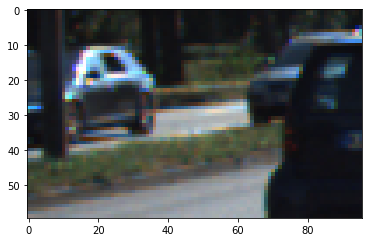

In [ ]:
#FOR READING FROM TEST FOLDER
#xmin,ymin,xmax,ymax = (115, 170, 242, 235) #FOR 001024
# xmin,ymin,xmax,ymax = (222, 172, 455, 320) #FOR 004701
# xmin,ymin,xmax,ymax = (400, 180, 505, 285) #FOR 004999
# xmin,xmax,ymin,ymax = (12, 320, 213, 350) #FOR 0000000011.png
xmin,xmax,ymin,ymax = (340, 436, 180, 240) #FOR 002048


patch = test_image[ymin:ymax, xmin:xmax]
plt.figure()
plt.imshow(patch/255.)
plt.show()


### Read BBs from label file (while using train data)

In [ ]:
#CAUTION!!!! FOR READING FROM TRAINING DIRECTORY
patches = []
bounds = []
for line in open(test_label_path).readlines():
    line = line.strip().split(' ')
    # print("2D object: ", line)
    xmin=int(float(line[4]))
    ymin=int(float(line[5]))
    xmax=int(float(line[6]))
    ymax=int(float(line[7]))

    patch = test_image[ymin:ymax, xmin:xmax]
    patch = cv2.resize(patch, (224, 224))
    patches.append(patch)
    bounds.append((xmin, ymin, xmax, ymax))

num_patches = len(patches)
fig=plt.figure(figsize=(15, 15))

for index, patch in enumerate(patches):
    fig.add_subplot(1, num_patches, index+1)
    plt.imshow(patch)

plt.show()




NameError: ignored

In [ ]:
# CAUTION: FOR TRAINING ONLY: choose one of the above
index = 0
patch = patches[index]
xmin, ymin, xmax, ymax = bounds[index]
plt.figure()
plt.imshow(patch)
plt.show()

### Read Projection Matrix

In [ ]:
with open(test_calib_path, "r") as f:
    c2c_file = f.readlines()

    for line in c2c_file:
          (key, val) = line.split(':', 1)
          if key == ('P2'):
                P_ = np.fromstring(val, sep=' ', dtype = 'float')
                P_ = P_.reshape(3, 4)
                #print("FOUND THIS", mode, P_)
                # erase 4th column ([0,0,0])
                #print("THE REMOVING 4TH COLUMN IS:", P_[:, 3])
                
                calib_mat = P_
                break
print("Projection mat:")
# calib_mat= [[7.215377e+02, 0.000000e+00, 6.095593e+02, 4.485728e+01],
#             [0.000000e+00, 7.215377e+02, 1.728540e+02, 2.163791e-01],
#             [0.000000e+00, 0.000000e+00, 1.000000e+00, 2.745884e-03]]
print(calib_mat)

Projection mat:
[[7.215377e+02 0.000000e+00 6.095593e+02 4.485728e+01]
 [0.000000e+00 7.215377e+02 1.728540e+02 2.163791e-01]
 [0.000000e+00 0.000000e+00 1.000000e+00 2.745884e-03]]


### Define and Prepare Projection utils

In [ ]:
def init_points3D(dims):
    points3D = np.zeros((8, 3))
    cnt = 0
    for i in [1, -1]:
        for j in [1, -1]:
            for k in [1, -1]:
                points3D[cnt] = dims[[1, 0, 2]].T / 2.0 * [i, k, j * i]
                cnt += 1
    return points3D

def gen_3D_box(yaw,dims,cam_to_img,box_2D):
    
    dims = dims.reshape((-1,1))
    box_2D = box_2D.reshape((-1,1))
    points3D = init_points3D(dims)

    rot_M = np.asarray([[np.cos(yaw), 0, np.sin(yaw)], [0, 1, 0], [-np.sin(yaw), 0, np.cos(yaw)]]) 
    #rot_M =  np.asarray([[1, 0, 0], [0, 1, 0], [0, 0, 1]]) 
    center = compute_center(points3D, rot_M, cam_to_img, box_2D, inds)

    points2D = points3D_to_2D(points3D, center, rot_M, cam_to_img)

    return points2D

def compute_center(points3D,rot_M,cam_to_img,box_2D,inds):
    
    fx = cam_to_img[0][0]
    fy = cam_to_img[1][1]
    u0 = cam_to_img[0][2]
    v0 = cam_to_img[1][2]
    
    W = np.array([[fx, 0, u0 - box_2D[0]],
                  [fx, 0, u0 - box_2D[2]],
                  [0, fy, v0 - box_2D[1]],
                  [0, fy, v0 - box_2D[3]]], dtype = 'float')
    center =None
    error_min = 1e10

    for ind in inds:
        y = np.zeros((4, 1))
        for i in range(len(ind)):
            
            RP = np.dot(rot_M, (points3D[ind[i]]).reshape((-1, 1)))
            y[i] = box_2D[i] * cam_to_img[2, 3] - np.dot(W[i], RP) - cam_to_img[i // 2, 3]
            
        result = solve_least_squre(W, y)
        error = compute_error(points3D, result, rot_M, cam_to_img, box_2D)
        
        if error < error_min and result[2,0]>0:
            center = result
            error_min = error
            
    return center

def draw_3D_box(image,points):
    points = points.astype(np.int)

    for i in range(4):
        point_1_ = points[2 * i]
        point_2_ = points[2 * i + 1]
        cv2.line(image, (point_1_[0], point_1_[1]), (point_2_[0], point_2_[1]), (0, 255, 0), 1)

    cv2.line(image,tuple(points[0]),tuple(points[7]),(0, 0, 255), 2)
    cv2.line(image, tuple(points[1]), tuple(points[6]), (0, 0, 255), 2)

    for i in range(8):
        point_1_ = points[i]
        point_2_ = points[(i + 2) % 8]
        cv2.line(image, (point_1_[0], point_1_[1]), (point_2_[0], point_2_[1]), (0, 255, 0), 1)

    return image;

def solve_least_squre(W,y):
    U, Sigma, VT = np.linalg.svd(W)
    result = np.dot(np.dot(np.dot(VT.T, np.linalg.pinv(np.eye(4, 3) * Sigma)), U.T), y)
    return result

def points3D_to_2D(points3D,center,rot_M,cam_to_img):
    points2D = []
    for point3D in points3D:
        point3D = point3D.reshape((-1,1))
        point = center + np.dot(rot_M, point3D)
        point = np.append(point, 1)
        point = np.dot(cam_to_img, point)
        point2D = point[:2] / point[2]
        points2D.append(point2D)
    points2D = np.asarray(points2D)

    return points2D

def compute_error(points3D,center,rot_M, cam_to_img,box_2D):
    points2D = points3D_to_2D(points3D, center, rot_M, cam_to_img)
    new_box_2D = np.asarray([np.min(points2D[:,0]),
                             np.max(points2D[:,0]),
                             np.min(points2D[:,1]),
                             np.max(points2D[:,1])]).reshape((-1,1))
    error = np.sum(np.abs(new_box_2D - box_2D))

    return error


### Project and Draw the 3D box

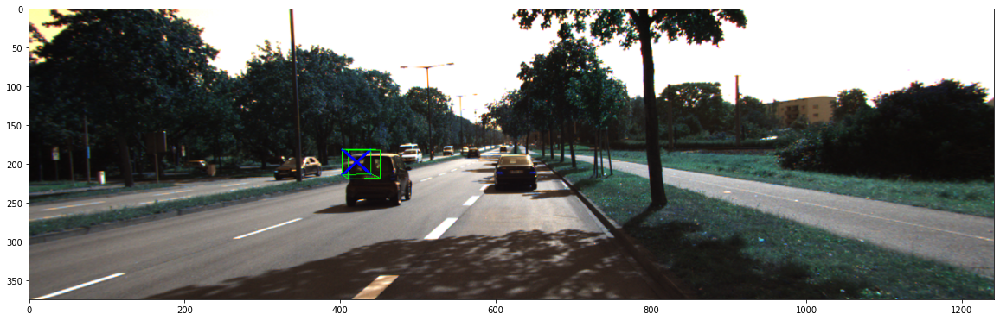

In [ ]:
inds = []
indx = [1, 3, 5, 7]
indy = [0, 1, 2, 3]
for i in indx:
    for j in indx:
        for m in indy:
            for n in indy:
                inds.append([i, j, m, n])

box_2D = np.asarray([xmin, ymin, xmax, ymax], dtype = np.float)
points2D = gen_3D_box(yaw, dims, calib_mat, box_2D) #switched yaw -> theta    
final_image = draw_3D_box(test_image.copy(), points2D)

plt.figure(figsize=(20,20))
plt.imshow(final_image/255.)
plt.show()

# **Set Up and Test 2D Model** 

## Setup Object Detection API

In [ ]:
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 56049, done.
remote: Counting objects: 100% (97/97), done.
remote: Compressing objects: 100% (61/61), done.
remote: Total 56049 (delta 38), reused 87 (delta 36), pack-reused 55952
Receiving objects: 100% (56049/56049), 572.04 MiB | 37.78 MiB/s, done.
Resolving deltas: 100% (38651/38651), done.


In [ ]:
!pip install protobuf protobuf-compiler

     |████████████████████████████████| 22.8MB 98kB/s 
     |████████████████████████████████| 10.6MB 21.7MB/s 
     |████████████████████████████████| 51kB 7.4MB/s 
  Created wheel for colorama: filename=colorama-0.3.3-cp37-none-any.whl size=14319 sha256=25bb6f1887ad125a74074e12d35861f71e3701f1a585d9f807bd86fccfbb4fa3
  Stored in directory: /root/.cache/pip/wheels/f4/87/9a/ec0d4fb026fd3ce57e41261149951ff978abbdbc8d69f9a072
Successfully built colorama
ERROR: tensorflow 1.15.2 has requirement gast==0.2.2, but you'll have gast 0.3.3 which is incompatible.
ERROR: spacy 2.2.4 has requirement tqdm<5.0.0,>=4.38.0, but you'll have tqdm 4.31.1 which is incompatible.
ERROR: fbprophet 0.7.1 has requirement tqdm>=4.36.1, but you'll have tqdm 4.31.1 which is incompatible.
  Found existing installation: grpcio 1.32.0
    Uninstalling grpcio-1.32.0:
      Successfully uninstalled grpcio-1.32.0
  Found existing installation: bleach 3.3.0
    Uninstalling bleach-3.3.0:
      Successfully uninstalled b

In [ ]:
%cd models/research

# Compile protos.
!protoc object_detection/protos/*.proto --python_out=.
# Install TensorFlow Object Detection API.
%cp object_detection/packages/tf1/setup.py .
!python -m pip install .

/content/models/research
Processing /content/models/research
     |████████████████████████████████| 358kB 16.8MB/s 
  Created wheel for object-detection: filename=object_detection-0.1-cp37-none-any.whl size=1643804 sha256=23402254a4579e55e550cf7f2329d4e9bc98cfceba37bcfd082b248b107bc711
  Stored in directory: /tmp/pip-ephem-wheel-cache-sw1_fsdg/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
Successfully built object-detection


In [ ]:
!python object_detection/builders/model_builder_tf1_test.py

Running tests under Python 3.7.10: /usr/bin/python3
[ RUN      ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params0 (True)
[       OK ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params0 (True)
[ RUN      ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params1 (False)
[       OK ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params1 (False)
[ RUN      ] ModelBuilderTF1Test.test_create_experimental_model
[       OK ] ModelBuilderTF1Test.test_create_experimental_model
[ RUN      ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature0 (True)
[       OK ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature0 (True)
[ RUN      ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature1 (False)
[       OK ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature1 (False)
[ RUN      ] ModelBuilderTF1Test.test_create_faster_rcnn_model_from_config_w

In [ ]:
%cd ../..

/content


## Download 2D detection model

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_resnet101_kitti_2018_01_28.tar.gz

--2021-04-16 13:00:13--  http://download.tensorflow.org/models/object_detection/faster_rcnn_resnet101_kitti_2018_01_28.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.31.128, 2607:f8b0:4004:c0b::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.31.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 582935418 (556M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet101_kitti_2018_01_28.tar.gz’

faster_rcnn_resnet1 100%[===================>] 555.93M   307MB/s    in 1.8s    

2021-04-16 13:00:15 (307 MB/s) - ‘faster_rcnn_resnet101_kitti_2018_01_28.tar.gz’ saved [582935418/582935418]



In [ ]:
!tar -xvf faster_rcnn_resnet101_kitti_2018_01_28.tar.gz

faster_rcnn_resnet101_kitti_2018_01_28/
faster_rcnn_resnet101_kitti_2018_01_28/model.ckpt.index
faster_rcnn_resnet101_kitti_2018_01_28/checkpoint
faster_rcnn_resnet101_kitti_2018_01_28/pipeline.config
faster_rcnn_resnet101_kitti_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_resnet101_kitti_2018_01_28/model.ckpt.meta
faster_rcnn_resnet101_kitti_2018_01_28/saved_model/
faster_rcnn_resnet101_kitti_2018_01_28/saved_model/saved_model.pb
faster_rcnn_resnet101_kitti_2018_01_28/saved_model/variables/
faster_rcnn_resnet101_kitti_2018_01_28/frozen_inference_graph.pb


## Load and Test 2D Model

In [ ]:
def load_graph(frozen_graph_filename):
    # We load the protobuf file from the disk and parse it to retrieve the 
    # unserialized graph_def
    with tf.gfile.GFile(frozen_graph_filename, "rb") as f:
        graph_def = tf.GraphDef()
        graph_def.ParseFromString(f.read())

    # yThen, we import the graph_def into a new Graph and returns it 
    with tf.Graph().as_default() as graph:
        # The name var will prefix every op/nodes in your graph
        # Since we load everthing in a new graph, this is not needed
        tf.import_graph_def(graph_def, name="2D")
    return graph

graph = load_graph('/content/faster_rcnn_resnet101_kitti_2018_01_28/frozen_inference_graph.pb')

# We can verify that we can access the list of operations in the graph

# for op in graph.get_operations():
#    print(op.name)

    # prefix/Placeholder/inputs_placeholder
    # ...
    # prefix/Accuracy/predictions



# We access the input and output nodes 
image_tensor = graph.get_tensor_by_name('2D/image_tensor:0')
# print(tf.shape(image_tensor))
scores_tensor = graph.get_tensor_by_name('2D/detection_scores:0')
# print(tf.shape(scores_tensor))
boxes_tensor = graph.get_tensor_by_name('2D/detection_boxes:0')
# print(tf.shape(boxes_tensor))
classes_tensor = graph.get_tensor_by_name('2D/detection_classes:0')
# print(tf.shape(classes_tensor))
num_tensor = graph.get_tensor_by_name('2D/num_detections:0')
# print(tf.shape(num_tensor))

    
# We launch a Session


test_image = cv2.imread(test_image_path)
image_width = test_image.shape[1]
image_height = test_image.shape[0]
# print(test_image)
with tf.Session(graph=graph) as sess:

    
    (boxes, scores, classes, num) = sess.run(
        [boxes_tensor, scores_tensor, classes_tensor, num_tensor],
        feed_dict={image_tensor: [test_image]})
# print(boxes)
# print(boxes.shape)
# print(scores)
# print(classes)
# print(num)

show= test_image.copy()
real_boxes=[]
for index in range(int(num[0])):
  box = boxes[0][index]
  real_box = (int(box[0]*image_height), int(box[1]*image_width), int(box[2]*image_height), int(box[3]*image_width))
  print(real_box, scores[0][index])
  show = cv2.rectangle(show, (real_box[1], real_box[0]), (real_box[3], real_box[2]), color=(0,0,255), thickness=1)
  real_boxes.append(real_box)

show = show[:, :, ::-1]

plt.figure(figsize=(60,60))
plt.imshow(show/255.)
plt.show()
    




NotFoundError: ignored

## 2D to 3D (For Testing 2D Model's boxes)


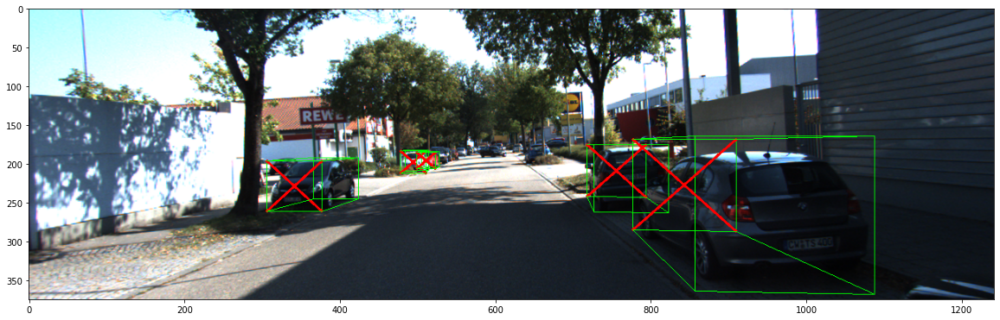

In [ ]:
final_image = test_image.copy()
for index, box in enumerate(real_boxes):
    ymin, xmin, ymax, xmax = box
    patch = test_image[ymin:ymax, xmin:xmax]
    patch = cv2.resize(patch, (224, 224))

    patch = patch - np.array([[[103.939, 116.779, 123.68]]])
    patch = np.expand_dims(patch, axis = 0)
    prediction = model.predict(patch)

    BIN = 6
    max_anc = np.argmax(prediction[2][0])
    anchors = prediction[1][0][max_anc]

    if anchors[1] > 0:
        angle_offset = np.arccos(anchors[0])
    else:
        angle_offset = -np.arccos(anchors[0])
    wedge = 2.*np.pi/BIN
    theta_loc = angle_offset + max_anc*wedge

    fx = calib_mat[0][0]
    u0 = calib_mat[0][2]
    v0 = calib_mat[1][2]

    box2d_center_x= (xmin + xmax) / 2.0
    theta_ray = np.arctan(fx /(box2d_center_x - u0))

    if theta_ray<0:
          theta_ray = theta_ray+np.pi

    # Theta Yaw
    theta = theta_loc + theta_ray
    yaw = np.pi/2 - theta

    #DIMENSION
    dims_avg = {'Car' : [1.52130159, 1.64441129, 3.85729945],
                'Truck': [ 3.07044968,  2.62877944, 11.17126338],
                'Van': [2.18560847, 1.91077601, 5.08042328],
                'Tram': [3.56005102,  2.4002551,  18.52173469] }
    dims = dims_avg['Car'] + prediction[0][0]

    inds = []
    indx = [1, 3, 5, 7]
    indy = [0, 1, 2, 3]
    for i in indx:
        for j in indx:
            for m in indy:
                for n in indy:
                    inds.append([i, j, m, n])

    box_2D = np.asarray([box[1], box[0], box[3], box[2]], dtype = np.float)
    points2D = gen_3D_box(yaw, dims, calib_mat, box_2D) #switched yaw -> theta    
    final_image = draw_3D_box(final_image, points2D)

final_image = final_image[:, :, ::-1]
plt.figure(figsize=(20,20))
plt.imshow(final_image/255.)
plt.show()

# **Complete Test**

## Open a Sample image from test/train dataset

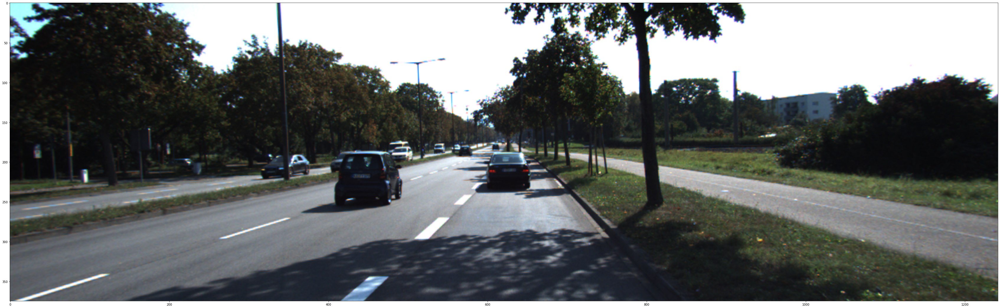

In [ ]:
#001024
#001100 on train : the github 
#001112 on train : a car on left towards right
#002048 on test : very similar to others' model
test_number = '001899'

test_image_path = 'testing/image_2/{test_number}.png'.format(test_number = test_number)
test_calib_path = 'testing/calib/{test_number}.txt'.format(test_number = test_number)

# CAUTION::: READING FROM TRAINING FILE!!!!!!!!
# test_image_path = 'training/image_2/{test_number}.png'.format(test_number = test_number)
# test_calib_path = 'training/calib/{test_number}.txt'.format(test_number = test_number)
# test_label_path = 'training/label_2/{test_number}.txt'.format(test_number = test_number)

# test_image_path = '0000000011.png'

test_image = cv2.imread(test_image_path)
test_image = test_image[:, :, ::-1]

plt.figure(figsize=(60,60))
plt.imshow(test_image/255.)
plt.show()

## Setup pre-trained 2D Model and Detect Vehicles in 2D

In [ ]:
def load_graph(frozen_graph_filename):
    # We load the protobuf file from the disk and parse it to retrieve the 
    # unserialized graph_def
    with tf.gfile.GFile(frozen_graph_filename, "rb") as f:
        graph_def = tf.GraphDef()
        graph_def.ParseFromString(f.read())

    # yThen, we import the graph_def into a new Graph and returns it 
    with tf.Graph().as_default() as graph:
        # The name var will prefix every op/nodes in your graph
        # Since we load everthing in a new graph, this is not needed
        tf.import_graph_def(graph_def, name="2D")
    return graph

graph = load_graph('/content/faster_rcnn_resnet101_kitti_2018_01_28/frozen_inference_graph.pb')

# We can verify that we can access the list of operations in the graph

# for op in graph.get_operations():
#    print(op.name)

    # prefix/Placeholder/inputs_placeholder
    # ...
    # prefix/Accuracy/predictions



# We access the input and output nodes 
image_tensor = graph.get_tensor_by_name('2D/image_tensor:0')
# print(tf.shape(image_tensor))
scores_tensor = graph.get_tensor_by_name('2D/detection_scores:0')
# print(tf.shape(scores_tensor))
boxes_tensor = graph.get_tensor_by_name('2D/detection_boxes:0')
# print(tf.shape(boxes_tensor))
classes_tensor = graph.get_tensor_by_name('2D/detection_classes:0')
# print(tf.shape(classes_tensor))
num_tensor = graph.get_tensor_by_name('2D/num_detections:0')
# print(tf.shape(num_tensor))

    
# We launch a Session


test_image = cv2.imread(test_image_path)
image_width = test_image.shape[1]
image_height = test_image.shape[0]
# print(test_image)
with tf.Session(graph=graph) as sess:

    
    (boxes, scores, classes, num) = sess.run(
        [boxes_tensor, scores_tensor, classes_tensor, num_tensor],
        feed_dict={image_tensor: [test_image]})
# print(boxes)
# print(boxes.shape)
# print(scores)
# print(classes)
# print(num)

show= test_image.copy()
real_boxes=[]
for index in range(int(num[0])):
  box = boxes[0][index]
  real_box = (int(box[0]*image_height), int(box[1]*image_width), int(box[2]*image_height), int(box[3]*image_width))
  print(real_box, scores[0][index])
  show = cv2.rectangle(show, (real_box[1], real_box[0]), (real_box[3], real_box[2]), color=(0,0,255), thickness=1)
  real_boxes.append(real_box)

show = show[:, :, ::-1]

plt.figure(figsize=(60,60))
plt.imshow(show/255.)
plt.show()
    




## 2D to 3D

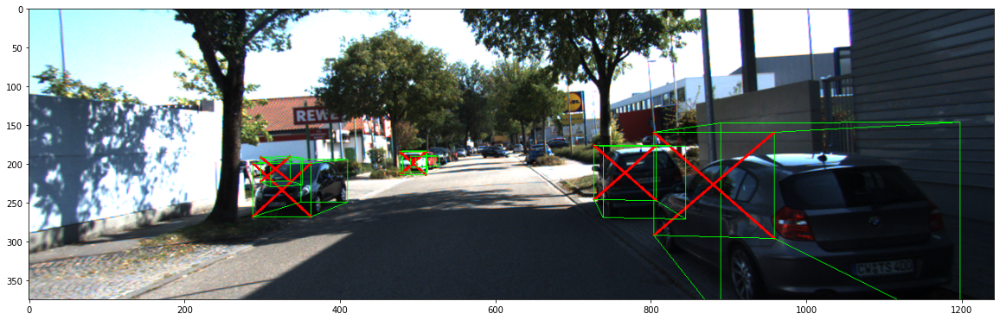

In [ ]:
final_image = test_image.copy()
for index, box in enumerate(real_boxes):
    ymin, xmin, ymax, xmax = box
    patch = test_image[ymin:ymax, xmin:xmax]
    patch = cv2.resize(patch, (224, 224))

    patch = patch / 255.0 - 0.5
    patch = np.expand_dims(patch, axis = 0)
    prediction = model.predict(patch)

    BIN = 6
    max_anc = np.argmax(prediction[2][0])
    anchors = prediction[1][0][max_anc]

    if anchors[1] > 0:
        angle_offset = np.arccos(anchors[0])
    else:
        angle_offset = -np.arccos(anchors[0])
    wedge = 2.*np.pi/BIN
    theta_loc = angle_offset + max_anc*wedge

    fx = calib_mat[0][0]
    u0 = calib_mat[0][2]
    v0 = calib_mat[1][2]

    box2d_center_x= (xmin + xmax) / 2.0
    theta_ray = np.arctan(fx /(box2d_center_x - u0))

    if theta_ray<0:
          theta_ray = theta_ray+np.pi

    # Theta Yaw
    theta = theta_loc + theta_ray
    yaw = np.pi/2 - theta

    #DIMENSION
    dims_avg = {'Car' : [1.52130159, 1.64441129, 3.85729945],
                'Truck': [ 3.07044968,  2.62877944, 11.17126338],
                'Van': [2.18560847, 1.91077601, 5.08042328],
                'Tram': [3.56005102,  2.4002551,  18.52173469] }
    dims = dims_avg['Car'] + prediction[0][0]

    inds = []
    indx = [1, 3, 5, 7]
    indy = [0, 1, 2, 3]
    for i in indx:
        for j in indx:
            for m in indy:
                for n in indy:
                    inds.append([i, j, m, n])

    box_2D = np.asarray([box[1], box[0], box[3], box[2]], dtype = np.float)
    points2D = gen_3D_box(yaw, dims, calib_mat, box_2D) #switched yaw -> theta    
    final_image = draw_3D_box(final_image, points2D)

final_image = final_image[:, :, ::-1]
plt.figure(figsize=(20,20))
plt.imshow(final_image/255.)
plt.show()

# Train 2D Network Yourself

## Generate TF record

In [ ]:
# In case you are running this cell again:

# !rm -rf data
# !rm -rf ouptut
# !rm -rf data_object_image_2



%mkdir data_object_image_2
%cd data_object_image_2
%mkdir training
%cd ..
%cp -r training/image_2 data_object_image_2/training/
%mkdir data
!mkdir output
!touch data/kitti_label_map.pbtxt
!printf 'item {\n id: 1\n name: "Car"\n}\nitem {\n id: 2\n name: "Van"\n}\nitem {\n id: 3\n name: "Truck"\n}\nitem {\n id: 4\n name: "pedestrian"\n}\nitem {\n id: 5\n name: "cyclist"\n}' >> data/kitti_label_map.pbtxt
print("MAKE SURE TO FIX THE LABELMAP FILES' \n S" )


In [ ]:
!rm -rf /content/data_object_image_2/training/image_2/.ipynb_checkpoints
%cp models/research/object_detection/legacy/train.py models/research/object_detection
!python /content/models/research/object_detection/dataset_tools/create_kitti_tf_record.py \
--data_dir=/content \
--output_path=/content/output/kitti.record \
--classes_to_use=Car,Van,Truck \
--validation_set_side=500

In [ ]:
# %cp output/kitti.record* gdrive/MyDrive
# %cp /content/faster_rcnn_resnet101_kitti_2018_01_28/pipeline.config gdrive/MyDrive

cp: cannot create regular file 'gdrive/MyDrive/kitti.record_train.tfrecord': Input/output error
cp: cannot create regular file 'gdrive/MyDrive/kitti.record_val.tfrecord': Input/output error
cp: cannot create regular file 'gdrive/MyDrive/pipeline.config': Input/output error


In [ ]:
!rm -rf /content/output_train
!python models/research/object_detection/train.py \
--logtostderr \
--train_dir=/content/output_train \
--pipeline_config_path=/content/faster_rcnn_resnet101_kitti_2018_01_28/pipeline.config

## Convert checkpoint to pb

In [ ]:

trained_checkpoint_prefix = '/content/gdrive/MyDrive/output_train/model.ckpt-3228'
export_dir = os.path.join('export_dir', '0')

graph = tf.Graph()
with tf.compat.v1.Session(graph=graph) as sess:
    # Restore from checkpoint
    loader = tf.compat.v1.train.import_meta_graph(trained_checkpoint_prefix + '.meta')
    loader.restore(sess, trained_checkpoint_prefix)

    # Export checkpoint to SavedModel
    builder = tf.compat.v1.saved_model.builder.SavedModelBuilder(export_dir)
    builder.add_meta_graph_and_variables(sess,
                                         [tf.saved_model.TRAINING, tf.saved_model.SERVING],
                                         strip_default_attrs=True)
    builder.save()  

Instructions for updating:
To construct input pipelines, use the `tf.data` module.
INFO:tensorflow:Restoring parameters from /content/gdrive/MyDrive/output_train/model.ckpt-3228


InvalidArgumentError: ignored

## pare_annotation_2d

In [ ]:
def parse_annotation_2d(label_dir, image_dir):

    print(len(os.listdir(label_dir)), "files found")

    labels = []
    images = []

    for label_file in os.listdir(label_dir):

        image_file = label_file.replace('txt', 'png')

        instance_annotations = []
        
        for line in open(label_dir + label_file).readlines():
          
            line = line.strip().split(' ')
            truncated = np.abs(float(line[1]))
            occluded  = np.abs(float(line[2]))
            
            if line[0] in VEHICLES and truncated < 0.3 and occluded <= 1:
                
                category = line[0]
                xmin = int(float(line[4]))
                ymin = int(float(line[5]))
                xmax = int(float(line[6]))
                ymax = int(float(line[7]))

                instance_annotations.append((xmin, ymin, xmax, ymax, category))

        
        # img = cv2.imread(image_dir + image_file)

        images.append(image_dir + image_file)
        labels.append(np.array(instance_annotations))
  
    labels = np.array(labels)
    images = np.array(images)

    return images, labels


""" Unit test

index = 5
images, labels = parse_annotation_2d(label_dir, image_dir)
print("images", images.shape)
print("labels", labels.shape)

img = cv2.imread(images[index])[:, :, ::-1]
print(img.shape)
plt.figure(figsize=(60,60))
plt.imshow(img/255.)
plt.show()
"""